In [1]:
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

In [2]:
img_size = 400

In [3]:
vgg19 = tf.keras.applications.VGG19(
  include_top = False,
  input_shape = (img_size, img_size, 3),
  weights = 'imagenet'
)

vgg19.trainable = False

In [4]:
NST_LAYERS = [
    ('block1_conv1', 0.2),
    ('block2_conv1', 0.2),
    ('block3_conv1', 0.2),
    ('block4_conv1', 0.2),
    ('block5_conv1', 0.2),
    ('block5_conv4', 1)
]

In [5]:
def get_layer_outputs(vgg, layer_names):
    outputs = [vgg.get_layer(layer[0]).output for layer in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

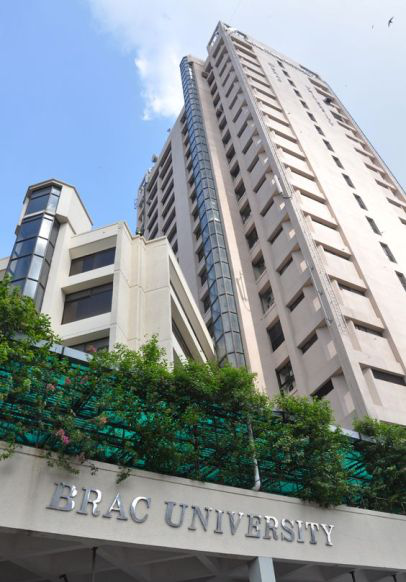

In [6]:
content_img = Image.open('/content/bracu.jpg')
content_img

In [7]:
vgg_model_outputs = get_layer_outputs(vgg19, NST_LAYERS)

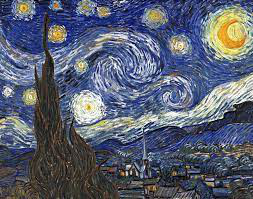

In [8]:
style_img = Image.open("/content/van_gogh.jpeg")
style_img

(1, 400, 400, 3)


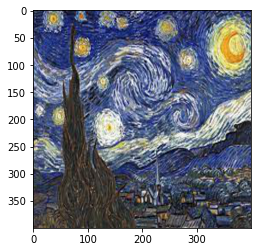

In [9]:
style_image =  np.array(Image.open("/content/van_gogh.jpeg").resize((img_size, img_size)))
style_image = tf.constant(np.reshape(style_image, ((1,) + style_image.shape)))

print(style_image.shape)
imshow(style_image[0])
plt.show()

(1, 400, 400, 3)


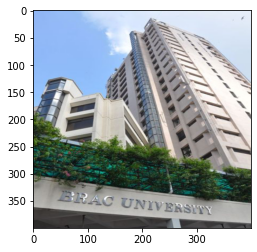

In [10]:
content_image = np.array(Image.open("/content/bracu.jpg").resize((img_size, img_size)))
content_image = tf.constant(np.reshape(content_image, ((1,) + content_image.shape)))

print(content_image.shape)
imshow(content_image[0])
plt.show()

In [11]:
def content_cost(content_outputs, generated_outputs):
  a_C, a_G  = content_outputs[-1], generated_outputs[-1]
  _, n_H, n_W, n_C = a_C.get_shape().as_list()
  J_content = (1 / (4 * n_H * n_W * n_C)) * tf.reduce_sum(tf.square(tf.subtract(a_C, a_G)))
  return J_content 

In [12]:
def style_matrix(M):
  return tf.matmul(M, tf.transpose(M))

In [13]:
def single_layer_style_cost(a_S, a_G):
  _, n_H, n_W, n_C = a_S.get_shape().as_list()
  a_S = tf.reshape(tf.transpose(a_S), shape = [n_C, n_H * n_W])
  a_G = tf.reshape(tf.transpose(a_G), shape = [n_C, n_H * n_W])

  GG = style_matrix(a_G)
  GS = style_matrix(a_S)

  J_style = (1 / (4 * n_C**2 * (n_H * n_W)**2)) * tf.reduce_sum(tf.square(tf.subtract(GS, GG)))
  return J_style

In [14]:
def style_cost(style_outputs, generated_outputs, layers):
  a_S, a_G = style_outputs[:-1], generated_outputs[:-1]
  J_style = 0

  for idx, (layer, weight) in enumerate(layers[:-1]):
    J_style += single_layer_style_cost(a_S[idx], a_G[idx]) * weight

  return J_style

In [15]:
@tf.function()
def total_cost(J_content, J_style, alpha = 10, beta = 40):
  return alpha * J_content + beta * J_style

(1, 400, 400, 3)


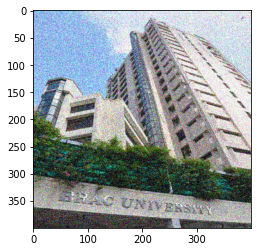

In [16]:
generated_image = tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
noise = tf.random.uniform(tf.shape(generated_image), -0.25, 0.25)
generated_image = tf.add(generated_image, noise)
generated_image = tf.clip_by_value(generated_image, clip_value_min=0.0, clip_value_max=1.0)


print(generated_image.shape)
imshow(generated_image.numpy()[0])
plt.show()

In [17]:
preprocessed_content =  tf.Variable(tf.image.convert_image_dtype(content_image, tf.float32))
a_C = vgg_model_outputs(preprocessed_content)

preprocessed_style =  tf.Variable(tf.image.convert_image_dtype(style_image, tf.float32))
a_S = vgg_model_outputs(preprocessed_style)


In [18]:
def clip_0_1(image):
    
    return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

def tensor_to_image(tensor):
  
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    return Image.fromarray(tensor)

In [19]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
@tf.function()
def train_step(generated_image):
    with tf.GradientTape() as tape:
        
        a_G = vgg_model_outputs(generated_image)

        J_style = style_cost(a_S, a_G, NST_LAYERS)

       
        J_content = content_cost(a_C, a_G)
        
        J = total_cost(J_content, J_style, alpha = 10, beta = 40)
    
        
    grad = tape.gradient(J, generated_image)

    optimizer.apply_gradients([(grad, generated_image)])
    generated_image.assign(clip_0_1(generated_image))
   
    return J

Epoch 0  tf.Tensor(31950.035, shape=(), dtype=float32)


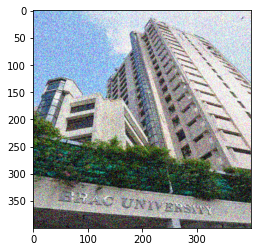

Epoch 250  tf.Tensor(238.39034, shape=(), dtype=float32)


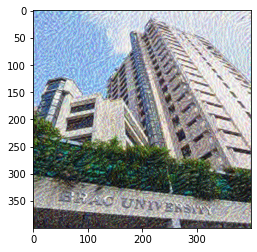

Epoch 500  tf.Tensor(100.36739, shape=(), dtype=float32)


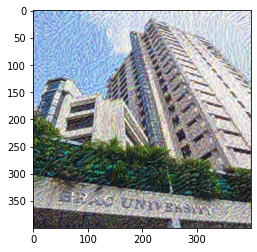

Epoch 750  tf.Tensor(61.18014, shape=(), dtype=float32)


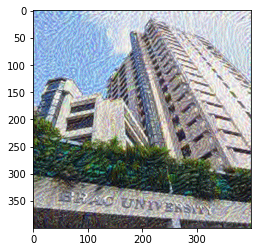

Epoch 1000  tf.Tensor(43.058727, shape=(), dtype=float32)


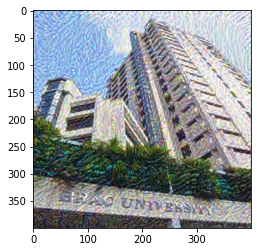

Epoch 1250  tf.Tensor(32.75363, shape=(), dtype=float32)


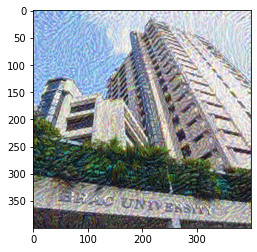

Epoch 1500  tf.Tensor(26.198168, shape=(), dtype=float32)


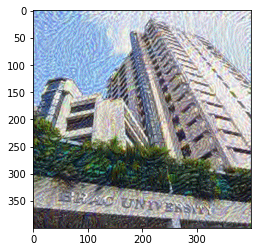

Epoch 1750  tf.Tensor(21.62346, shape=(), dtype=float32)


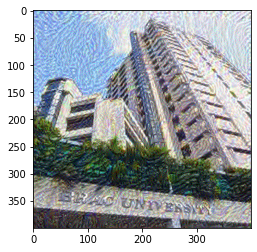

Epoch 2000  tf.Tensor(18.268047, shape=(), dtype=float32)


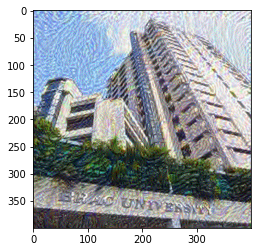

Epoch 2250  tf.Tensor(15.734848, shape=(), dtype=float32)


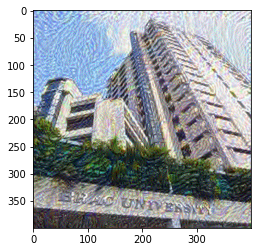

Epoch 2500  tf.Tensor(13.764077, shape=(), dtype=float32)


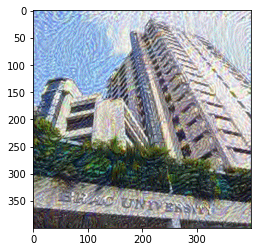

Epoch 2750  tf.Tensor(12.192978, shape=(), dtype=float32)


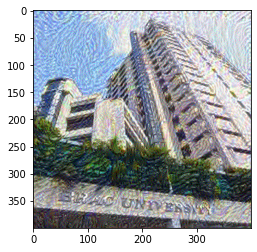

Epoch 3000  tf.Tensor(10.928716, shape=(), dtype=float32)


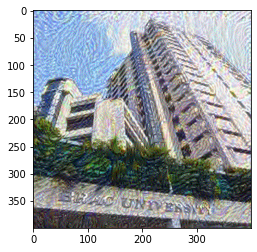

Epoch 3250  tf.Tensor(9.883725, shape=(), dtype=float32)


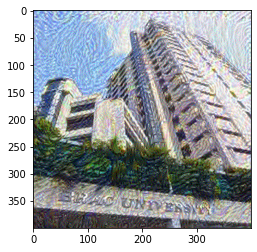

Epoch 3500  tf.Tensor(9.002408, shape=(), dtype=float32)


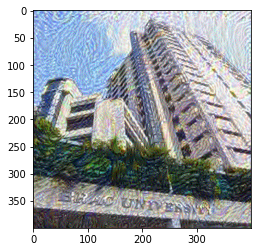

Epoch 3750  tf.Tensor(8.242053, shape=(), dtype=float32)


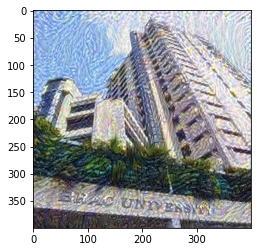

Epoch 4000  tf.Tensor(7.5788665, shape=(), dtype=float32)


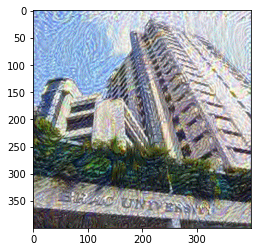

Epoch 4250  tf.Tensor(6.9997625, shape=(), dtype=float32)


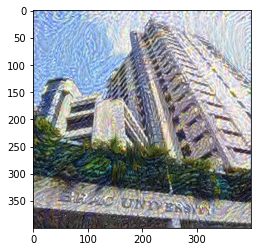

Epoch 4500  tf.Tensor(6.4876647, shape=(), dtype=float32)


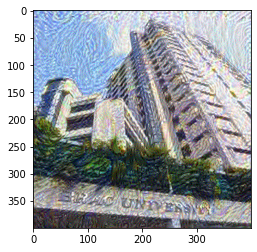

Epoch 4750  tf.Tensor(6.0325503, shape=(), dtype=float32)


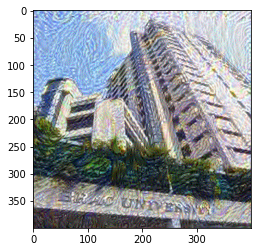

Epoch 5000  tf.Tensor(5.6234045, shape=(), dtype=float32)


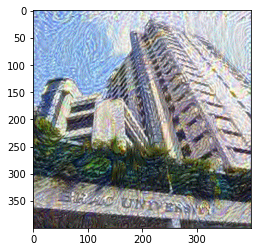

Epoch 5250  tf.Tensor(5.2512007, shape=(), dtype=float32)


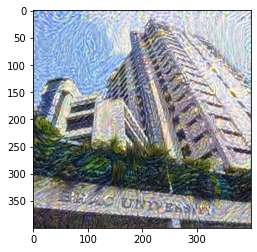

Epoch 5500  tf.Tensor(4.912868, shape=(), dtype=float32)


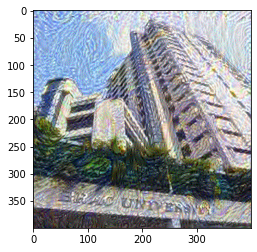

Epoch 5750  tf.Tensor(4.6043043, shape=(), dtype=float32)


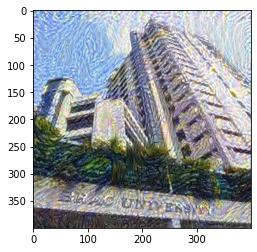

Epoch 6000  tf.Tensor(4.3240886, shape=(), dtype=float32)


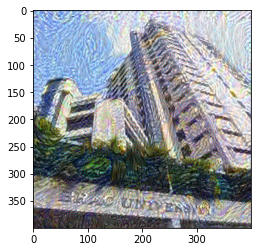

Epoch 6250  tf.Tensor(4.067651, shape=(), dtype=float32)


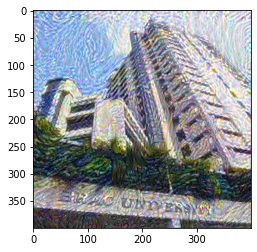

Epoch 6500  tf.Tensor(3.8318462, shape=(), dtype=float32)


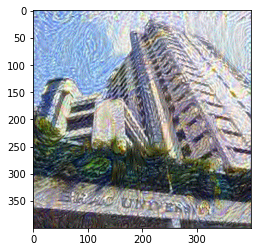

Epoch 6750  tf.Tensor(3.6140747, shape=(), dtype=float32)


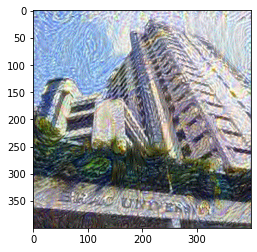

Epoch 7000  tf.Tensor(3.413299, shape=(), dtype=float32)


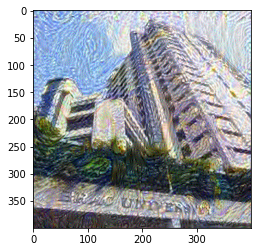

Epoch 7250  tf.Tensor(3.2282574, shape=(), dtype=float32)


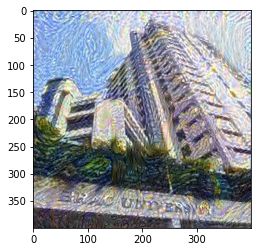

Epoch 7500  tf.Tensor(3.0558808, shape=(), dtype=float32)


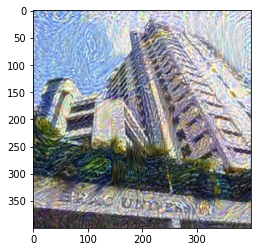

Epoch 7750  tf.Tensor(2.8956842, shape=(), dtype=float32)


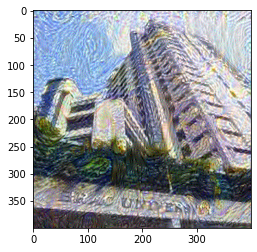

Epoch 8000  tf.Tensor(2.7475433, shape=(), dtype=float32)


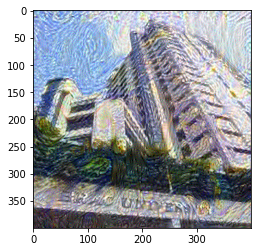

Epoch 8250  tf.Tensor(2.612088, shape=(), dtype=float32)


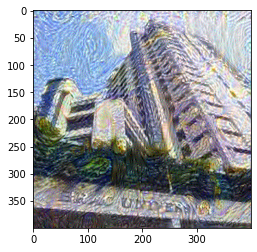

Epoch 8500  tf.Tensor(2.489963, shape=(), dtype=float32)


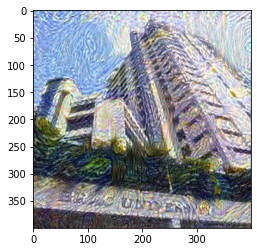

Epoch 8750  tf.Tensor(2.3810503, shape=(), dtype=float32)


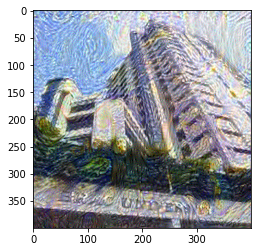

Epoch 9000  tf.Tensor(2.290597, shape=(), dtype=float32)


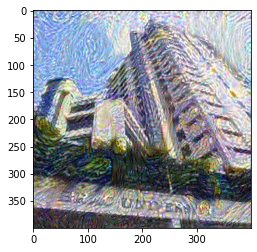

Epoch 9250  tf.Tensor(2.1933932, shape=(), dtype=float32)


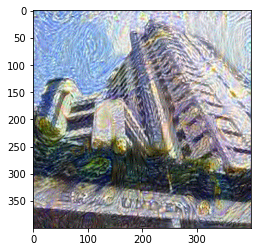

Epoch 9500  tf.Tensor(2.1134434, shape=(), dtype=float32)


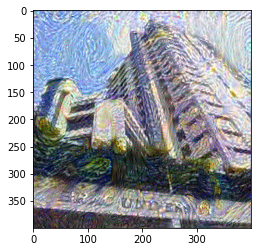

Epoch 9750  tf.Tensor(2.0417967, shape=(), dtype=float32)


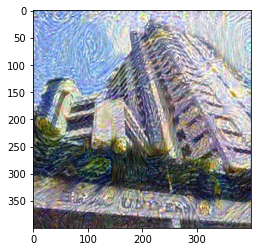

Epoch 10000  tf.Tensor(1.9757835, shape=(), dtype=float32)


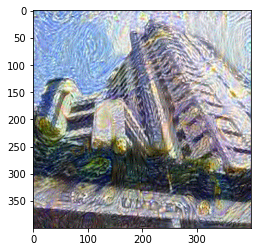

Epoch 10250  tf.Tensor(1.9210217, shape=(), dtype=float32)


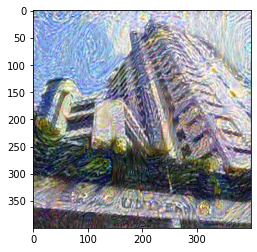

Epoch 10500  tf.Tensor(1.9213685, shape=(), dtype=float32)


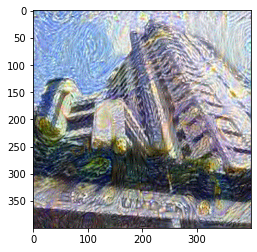

Epoch 10750  tf.Tensor(1.8146574, shape=(), dtype=float32)


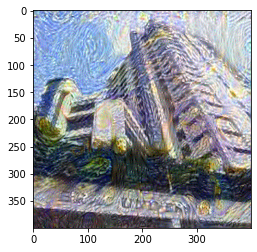

Epoch 11000  tf.Tensor(1.7644541, shape=(), dtype=float32)


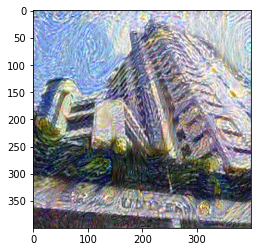

Epoch 11250  tf.Tensor(1.7222592, shape=(), dtype=float32)


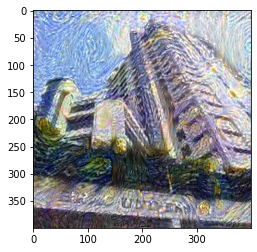

Epoch 11500  tf.Tensor(1.6835563, shape=(), dtype=float32)


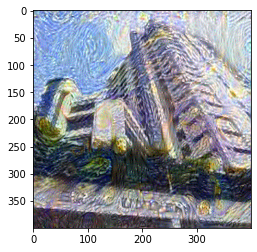

Epoch 11750  tf.Tensor(1.6476083, shape=(), dtype=float32)


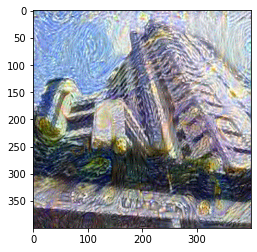

Epoch 12000  tf.Tensor(1.8331224, shape=(), dtype=float32)


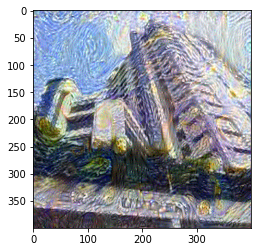

Epoch 12250  tf.Tensor(1.5835439, shape=(), dtype=float32)


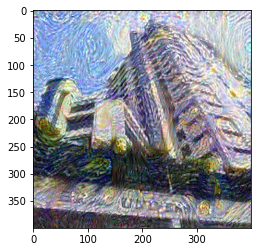

Epoch 12500  tf.Tensor(1.5545624, shape=(), dtype=float32)


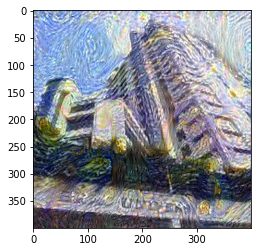

Epoch 12750  tf.Tensor(1.5266455, shape=(), dtype=float32)


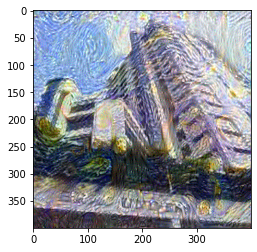

Epoch 13000  tf.Tensor(1.501707, shape=(), dtype=float32)


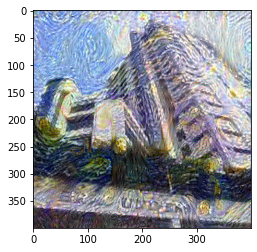

Epoch 13250  tf.Tensor(1.4780672, shape=(), dtype=float32)


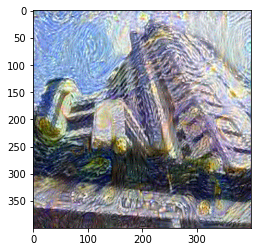

Epoch 13500  tf.Tensor(1.4562805, shape=(), dtype=float32)


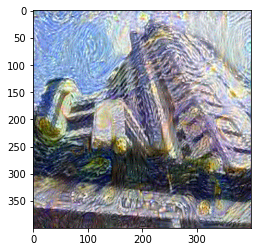

Epoch 13750  tf.Tensor(1.6832936, shape=(), dtype=float32)


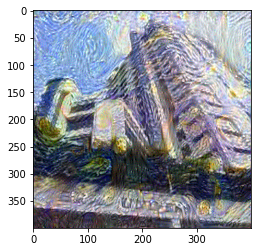

Epoch 14000  tf.Tensor(1.4219097, shape=(), dtype=float32)


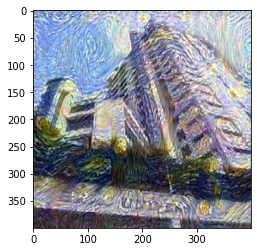

Epoch 14250  tf.Tensor(1.3953004, shape=(), dtype=float32)


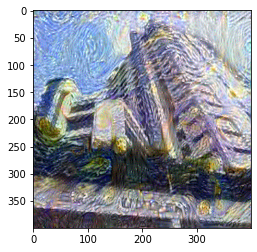

Epoch 14500  tf.Tensor(1.3798889, shape=(), dtype=float32)


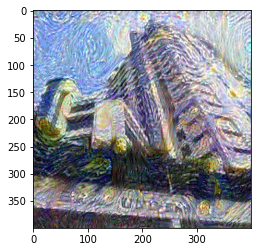

Epoch 14750  tf.Tensor(1.3607233, shape=(), dtype=float32)


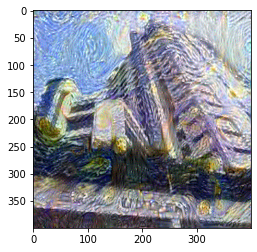

Epoch 15000  tf.Tensor(1.6189866, shape=(), dtype=float32)


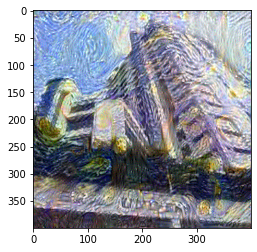

Epoch 15250  tf.Tensor(1.3307757, shape=(), dtype=float32)


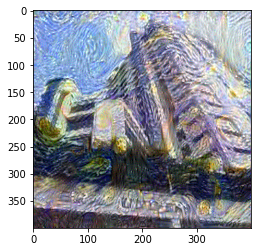

Epoch 15500  tf.Tensor(1.3154514, shape=(), dtype=float32)


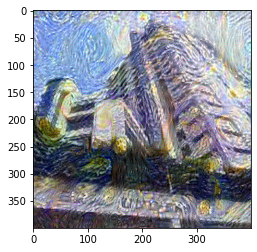

Epoch 15750  tf.Tensor(1.3361382, shape=(), dtype=float32)


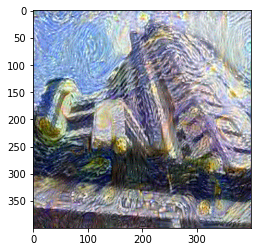

Epoch 16000  tf.Tensor(1.3082173, shape=(), dtype=float32)


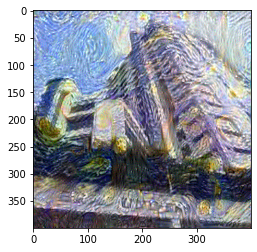

Epoch 16250  tf.Tensor(1.3487451, shape=(), dtype=float32)


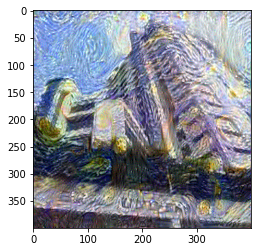

Epoch 16500  tf.Tensor(1.2669468, shape=(), dtype=float32)


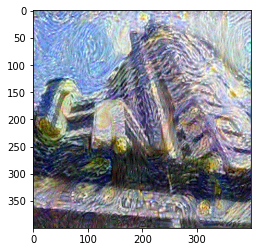

Epoch 16750  tf.Tensor(1.2924495, shape=(), dtype=float32)


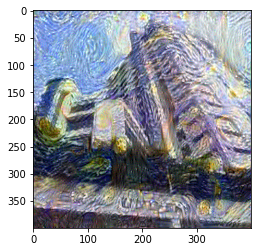

Epoch 17000  tf.Tensor(1.3615161, shape=(), dtype=float32)


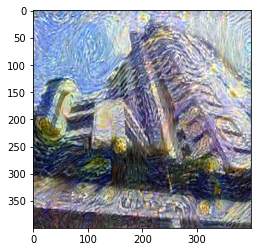

Epoch 17250  tf.Tensor(1.2301801, shape=(), dtype=float32)


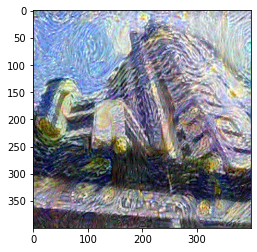

Epoch 17500  tf.Tensor(1.2208885, shape=(), dtype=float32)


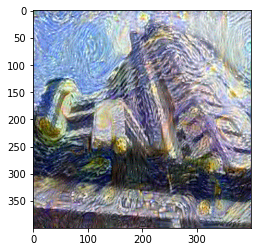

Epoch 17750  tf.Tensor(1.3832415, shape=(), dtype=float32)


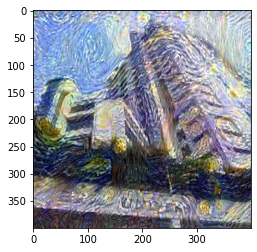

Epoch 18000  tf.Tensor(1.1983217, shape=(), dtype=float32)


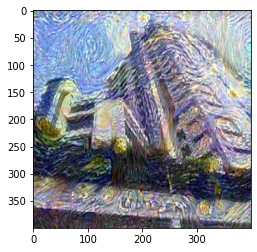

Epoch 18250  tf.Tensor(1.1887528, shape=(), dtype=float32)


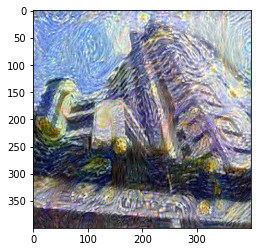

Epoch 18500  tf.Tensor(1.2312224, shape=(), dtype=float32)


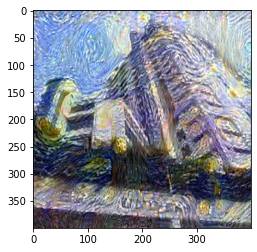

Epoch 18750  tf.Tensor(1.4888508, shape=(), dtype=float32)


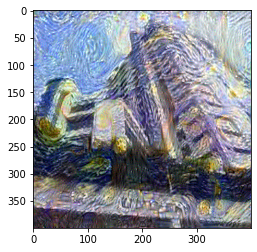

Epoch 19000  tf.Tensor(1.162366, shape=(), dtype=float32)


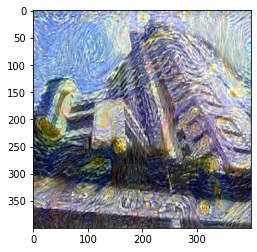

Epoch 19250  tf.Tensor(1.155296, shape=(), dtype=float32)


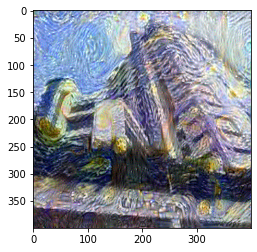

Epoch 19500  tf.Tensor(1.1534154, shape=(), dtype=float32)


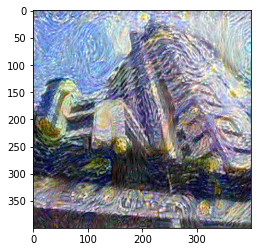

Epoch 19750  tf.Tensor(1.1410981, shape=(), dtype=float32)


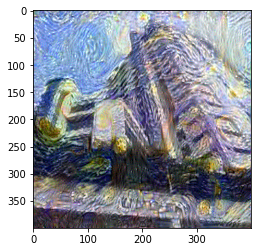

In [20]:
generated_image = tf.Variable(generated_image)

epochs = 20000
for i in range(epochs):
  J = train_step(generated_image)
  if i % 250 == 0:
        print(f"Epoch {i} ", J)
  if i % 250 == 0:
      image = tensor_to_image(generated_image)
      plt.imshow(image)
      plt.show()
      

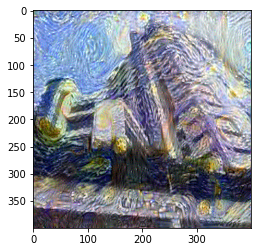

In [21]:
image = tensor_to_image(generated_image)

plt.imshow(image)

In [23]:
image.resize((1080, 720))
image.save('/content/bracu_van_gogh.jpg')